#**[Teaching Machines to Understand Sign Language](https://www.sciencebuddies.org/)**

**Research Overview**

Some people use sign language to talk instead of using their voice. But not everyone understands sign language. In places like hospitals, it can be hard to find a sign language translator quickly, and this can cause big problems, especially when the doctor needs to get consent from the patient. We wanted to find out if a computer (AI) can learn to understand sign language by watching people. If it can, then one day AI could help people who use sign language talk to people who don’t.

**Research Question**

Can AI learn to recognize different sign language gestures from short videos, and how accurate can it become with a small dataset?
Hypothesis
We think that if we train the AI with many short videos of sign language gestures, then the AI will be able to correctly recognize those signs in new videos. This is because computers can learn patterns from examples using machine learning.

**Research Objectives**

•	Build an AI model that can recognize hand signs from videos.

•	Train the model using videos that we recorded ourselves.

•	Test how accurate the AI is on new videos it has never seen.


## **How To Use This Notebook**

This notebook contains text fields, like this one, that give you information about the project and instructions.

In [ ]:
# There are also code blocks, like this one.

# The green text in a code block are comments. Comments are descriptions of what the code does.

# The non-green text in a code block is the Python code. Click on the triangle in the top left corner to run this code block.

print("Congratulations, you ran a code block! Try changing the text in the code and running it again.")

Congratulations, you ran a code block! Try changing the text in the code and running it again.


# Installing Dependencies

In [ ]:
!pip uninstall -y mediapipe jax jaxlib numpy ml_dtypes
!pip install numpy==1.26.4
!pip install ml_dtypes==0.3.2
!pip install tensorflow==2.16.1
!pip install mediapipe==0.10.14 --no-deps

Found existing installation: mediapipe 0.10.14
Uninstalling mediapipe-0.10.14:
  Successfully uninstalled mediapipe-0.10.14
Found existing installation: numpy 1.26.4
Uninstalling numpy-1.26.4:
  Successfully uninstalled numpy-1.26.4
Found existing installation: ml-dtypes 0.3.2
Uninstalling ml-dtypes-0.3.2:
  Successfully uninstalled ml-dtypes-0.3.2
  Using cached numpy-1.26.4-cp312-cp312-manylinux_2_17_x86_64.manylinux2014_x86_64.whl.metadata (61 kB)
Using cached numpy-1.26.4-cp312-cp312-manylinux_2_17_x86_64.manylinux2014_x86_64.whl (18.0 MB)
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
tensorflow 2.16.1 requires ml-dtypes~=0.3.1, which is not installed.
keras 3.13.2 requires ml-dtypes, which is not installed.
flax 0.11.2 requires jax>=0.6.0, which is not installed.
tensorstore 0.1.82 requires ml_dtypes>=0.5.0, which is not installed.
orbax-checkpoint 0.11.

  Using cached ml_dtypes-0.3.2-cp312-cp312-manylinux_2_17_x86_64.manylinux2014_x86_64.whl.metadata (20 kB)
Using cached ml_dtypes-0.3.2-cp312-cp312-manylinux_2_17_x86_64.manylinux2014_x86_64.whl (2.2 MB)
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
orbax-checkpoint 0.11.36 requires jax>=0.6.0, which is not installed.
dopamine-rl 4.1.2 requires jax>=0.1.72, which is not installed.
dopamine-rl 4.1.2 requires jaxlib>=0.1.51, which is not installed.
tensorflow-text 2.20.1 requires tensorflow<2.21,>=2.20.0, but you have tensorflow 2.16.1 which is incompatible.
tensorstore 0.1.82 requires ml_dtypes>=0.5.0, but you have ml-dtypes 0.3.2 which is incompatible.
ydf-tf 2.20.0 requires tensorflow==2.20.0, but you have tensorflow 2.16.1 which is incompatible.
tf-keras 2.20.0 requires tensorflow<2.21,>=2.20, but you have tensorflow 2.16.1 which is incompatible.
  Using ca

In [ ]:
import os
os.kill(os.getpid(), 9)

# 1. Importing Libraries

In [ ]:
# General libraries
import os  # For interacting with the operating system (e.g., file handling)
import time  # For time-related functions
import numpy as np  # For numerical operations and handling arrays
import scipy.stats  # For statistical functions (e.g., mode, z-test)
import random
import pandas as pd

# Visualization libraries
import matplotlib.pyplot as plt  # For plotting graphs and images
from IPython.display import display, Image  # For displaying images and other media in Jupyter/Colab

# Computer Vision Libraries
import cv2  # For computer vision tasks such as image and video processing
import mediapipe as mp  # For using MediaPipe's machine learning models for pose detection and more
from google.colab.patches import cv2_imshow  # For displaying images with OpenCV in Google Colab

# Machine Learning Libraries
from sklearn.model_selection import train_test_split  # For splitting data into training and testing sets
from sklearn.metrics import multilabel_confusion_matrix, accuracy_score  # For model evaluation

# Deep Learning Libraries (TensorFlow and Keras)
from tensorflow.keras.utils import to_categorical  # For converting labels to categorical format (one-hot encoding)
from tensorflow.keras.models import Sequential  # For defining the neural network architecture
from tensorflow.keras.layers import LSTM, Dense  # For adding LSTM and Dense layers to the model
from tensorflow.keras.callbacks import TensorBoard  # For logging training progress for TensorBoard
from tensorflow.keras.models import load_model  # For loading pre-trained models

In [ ]:
# Import the 'drive' module from Google Colab to interact with Google Drive
from google.colab import drive

# Mount Google Drive to access files stored in it. This will create a folder 'drive' in the '/content' directory.
# After running this, you will be prompted to authorize Colab to access your Google Drive.
drive.mount('/content/drive', force_remount=True)

Mounted at /content/drive


In [ ]:
# Set the base directory to the specified path on Google Drive.
# This is the location where the 'sign_language_detection' folder is stored within the 'MyDrive' folder.
base_dir = "/content/drive/MyDrive/sign_language_detection"

test_videos_path = os.path.join(base_dir, 'test_videos')
if not os.path.exists(test_videos_path):
    os.makedirs(test_videos_path)

DATA_PATH = os.path.join(base_dir, 'MP_Data')

# 2. Detecting Keypoints using MP Holistic

Code Block 2A

In [ ]:
# Initialize the Holistic model from MediaPipe for full-body pose detection.
# This model can detect landmarks for the face, hands, and body.
mp_holistic = mp.solutions.holistic

# Initialize the drawing utilities from MediaPipe to draw the landmarks on images or videos.
# These utilities help visualize the pose detection results by drawing the keypoints and connections.
mp_drawing = mp.solutions.drawing_utils

# This function processes an image using a MediaPipe model to detect landmarks/poses and returns the processed image and the results.
def mediapipe_detection(image, model):
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB) # COLOR CONVERSION BGR 2 RGB
    image.flags.writeable = False                  # Image is no longer writeable
    results = model.process(image)                 # Make prediction
    image.flags.writeable = True                   # Image is now writeable
    image = cv2.cvtColor(image, cv2.COLOR_RGB2BGR) # COLOR COVERSION RGB 2 BGR
    return image, results

# This function draws the detected pose, left hand, and right hand landmarks with their connections on the given image.
def draw_landmarks(image, results):
    mp_drawing.draw_landmarks(image, results.pose_landmarks, mp_holistic.POSE_CONNECTIONS) # Draw pose connections
    mp_drawing.draw_landmarks(image, results.left_hand_landmarks, mp_holistic.HAND_CONNECTIONS) # Draw left hand connections
    mp_drawing.draw_landmarks(image, results.right_hand_landmarks, mp_holistic.HAND_CONNECTIONS) # Draw right hand connections

# This function draws the pose, left hand, and right hand landmarks with custom styling (color, thickness, and circle radius)
# on the given image, using the MediaPipe Holistic model's results.
def draw_styled_landmarks(image, results):
    # Draw pose connections
    mp_drawing.draw_landmarks(image, results.pose_landmarks, mp_holistic.POSE_CONNECTIONS,
                             mp_drawing.DrawingSpec(color=(80,22,10), thickness=2, circle_radius=4),
                             mp_drawing.DrawingSpec(color=(80,44,121), thickness=2, circle_radius=2)
                             )
    # Draw left hand connections
    mp_drawing.draw_landmarks(image, results.left_hand_landmarks, mp_holistic.HAND_CONNECTIONS,
                             mp_drawing.DrawingSpec(color=(121,22,76), thickness=2, circle_radius=4),
                             mp_drawing.DrawingSpec(color=(121,44,250), thickness=2, circle_radius=2)
                             )
    # Draw right hand connections
    mp_drawing.draw_landmarks(image, results.right_hand_landmarks, mp_holistic.HAND_CONNECTIONS,
                             mp_drawing.DrawingSpec(color=(245,117,66), thickness=2, circle_radius=4),
                             mp_drawing.DrawingSpec(color=(245,66,230), thickness=2, circle_radius=2)
                             )

Code Block 2B

Video: /content/drive/MyDrive/sign_language_detection/test_videos/test_video_1.mov
Total frames: 673
Selected frames: 30


/usr/local/lib/python3.12/dist-packages/google/protobuf/symbol_database.py:55: UserWarning: SymbolDatabase.GetPrototype() is deprecated. Please use message_factory.GetMessageClass() instead. SymbolDatabase.GetPrototype() will be removed soon.
  warnings.warn('SymbolDatabase.GetPrototype() is deprecated. Please '


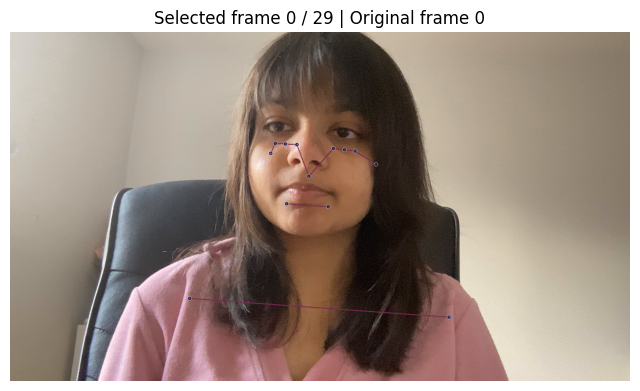

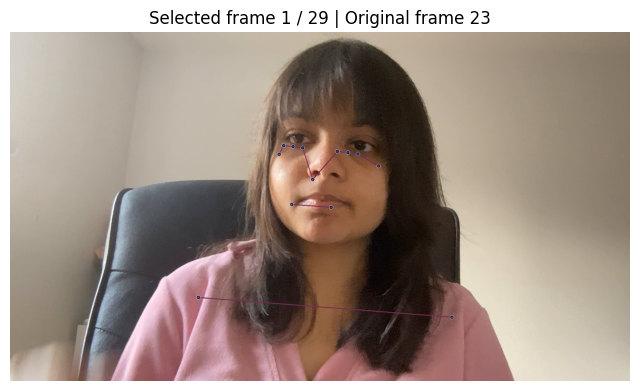

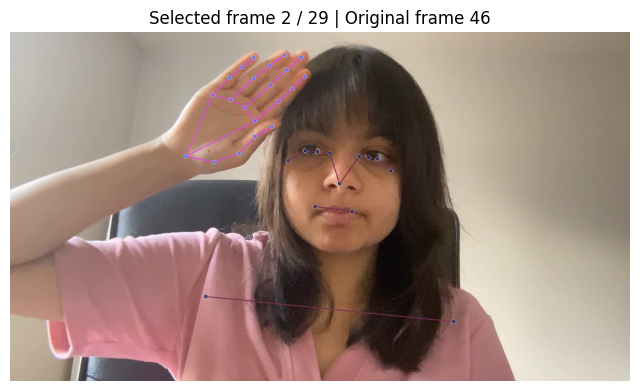

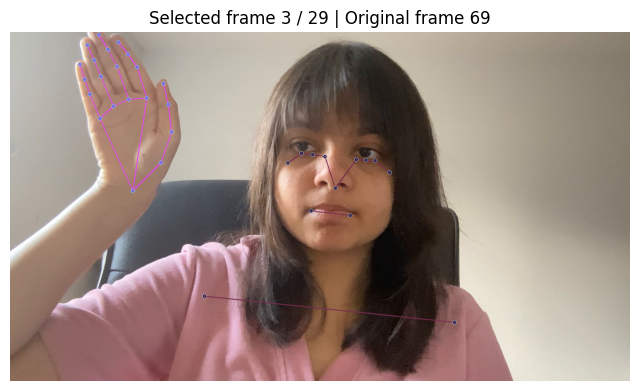

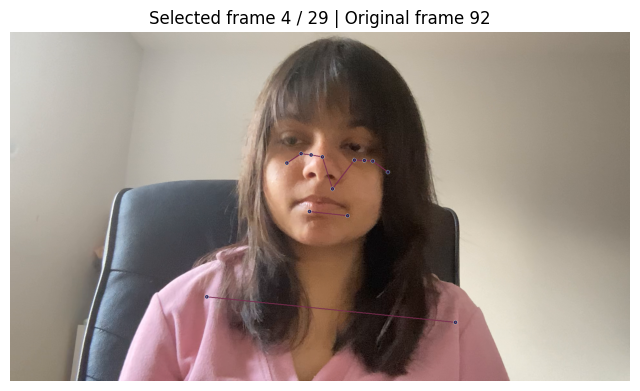

...

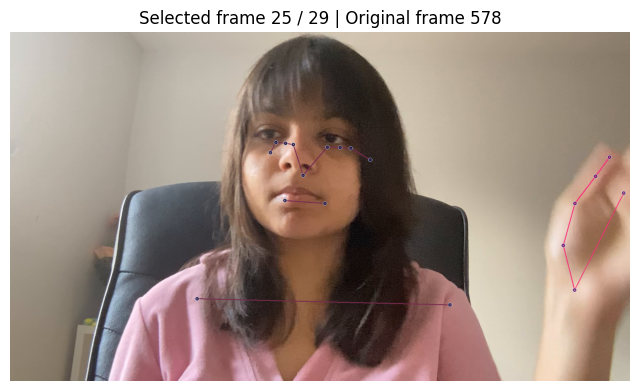

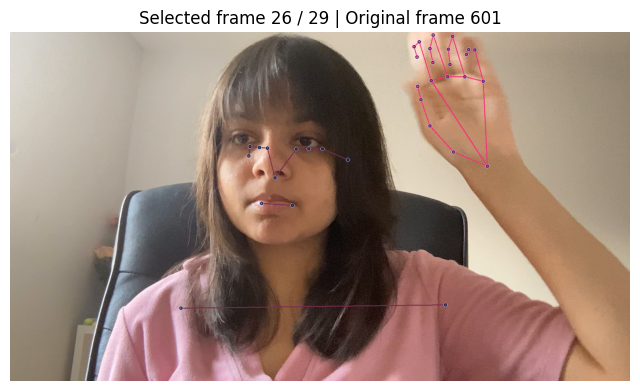

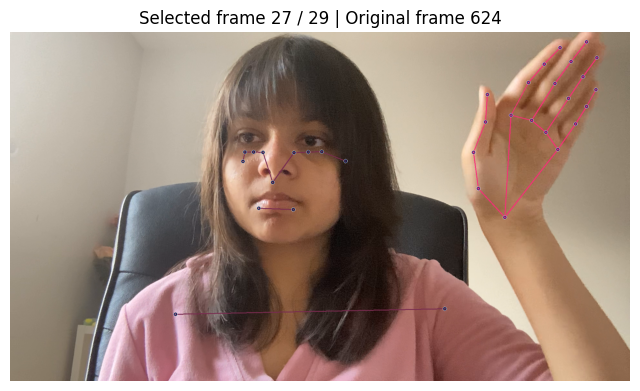

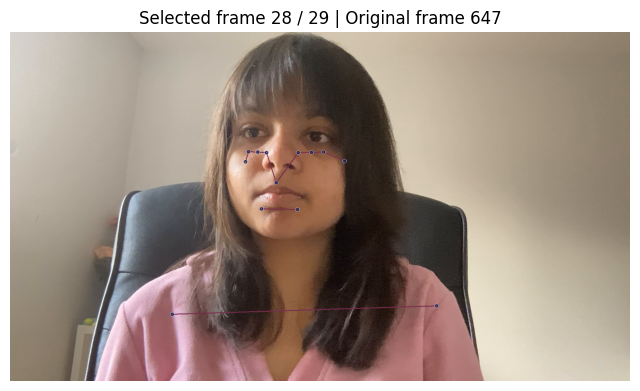

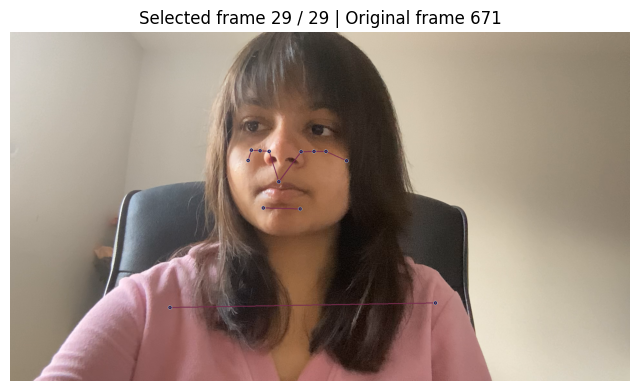

In [ ]:
# TODO: Change the name of the test video to ensure the code is running
video_name = "test_video_1.mov"
video_path = os.path.join(test_videos_path, video_name)

# Try to open the video
cap = cv2.VideoCapture(video_path)

# Check if the video opened successfully
if not cap.isOpened():
    raise FileNotFoundError(
        f"Error: Cannot open video file '{video_path}'. Please check if the file exists and the path is correct."
    )

# Set MediaPipe model
mp_holistic = mp.solutions.holistic

# Use the same frame selection logic as Section 5
target_frame_count = sequence_length if "sequence_length" in globals() else 30
total_frames = int(cap.get(cv2.CAP_PROP_FRAME_COUNT))

print("Video:", video_path)
print("Total frames:", total_frames)
print("Selected frames:", target_frame_count)

if total_frames < 2:
    cap.release()
    raise ValueError("Video does not have enough frames.")

frame_indices = np.linspace(0, total_frames - 2, target_frame_count, dtype=int)

with mp_holistic.Holistic(
    min_detection_confidence=0.5,
    min_tracking_confidence=0.5
) as holistic:

    for frame_num, frame_index in enumerate(frame_indices):
        cap.set(cv2.CAP_PROP_POS_FRAMES, frame_index)

        ret, frame = cap.read()

        if not ret:
            print(f"⚠ Could not read selected frame {frame_num} / original frame {frame_index}")
            continue

        # Do NOT flip vertically
        # frame = cv2.flip(frame, 0)

        # Make detections
        image, results = mediapipe_detection(frame, holistic)

        # Draw landmarks
        draw_styled_landmarks(image, results)

        # Convert BGR to RGB for Colab display
        image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

        # Display every selected frame
        plt.figure(figsize=(8, 8))
        plt.imshow(image_rgb)
        plt.axis("off")
        plt.title(f"Selected frame {frame_num} / 29 | Original frame {frame_index}")
        display(plt.gcf())
        plt.close()

cap.release()

# 3. Extracting Keypoint Values

Code Block 3A

In [ ]:
# Extract keypoints safely from MediaPipe Holistic results
# Output length = 1662

def extract_keypoints(results):
    pose = np.array([
        [res.x, res.y, res.z, res.visibility]
        for res in results.pose_landmarks.landmark
    ]).flatten() if results.pose_landmarks else np.zeros(33 * 4)

    face = np.array([
        [res.x, res.y, res.z]
        for res in results.face_landmarks.landmark
    ]).flatten() if results.face_landmarks else np.zeros(468 * 3)

    lh = np.array([
        [res.x, res.y, res.z]
        for res in results.left_hand_landmarks.landmark
    ]).flatten() if results.left_hand_landmarks else np.zeros(21 * 3)

    rh = np.array([
        [res.x, res.y, res.z]
        for res in results.right_hand_landmarks.landmark
    ]).flatten() if results.right_hand_landmarks else np.zeros(21 * 3)

    return np.concatenate([pose, face, lh, rh])

# 4. Setting up Folders for Collection

Code Block 4A

In [ ]:
# Define the set of actions/signs to detect
actions = np.array(['hello', 'thank_you', 'see_you_later'])

# Paths
DATA_PATH = os.path.join(base_dir, 'MP_Data')
VIDEO_PATH = os.path.join(base_dir, 'training_videos')

# Number of frames extracted from each video
sequence_length = 30

# Create main folders
os.makedirs(DATA_PATH, exist_ok=True)
os.makedirs(VIDEO_PATH, exist_ok=True)

# Create one folder per action
for action in actions:
    os.makedirs(os.path.join(DATA_PATH, action), exist_ok=True)
    os.makedirs(os.path.join(VIDEO_PATH, action), exist_ok=True)

print("DATA_PATH:", DATA_PATH)
print("VIDEO_PATH:", VIDEO_PATH)
print("Actions:", actions)
print("Sequence length:", sequence_length)

DATA_PATH: /content/drive/MyDrive/sign_language_detection/MP_Data
VIDEO_PATH: /content/drive/MyDrive/sign_language_detection/training_videos
Actions: ['hello' 'thank_you' 'see_you_later']
Sequence length: 30


# 5. Collecting Keypoint Values for Training and Testing

Code Block 5A

In [ ]:
# Process videos and save extracted keypoints dynamically
# Clears old MP_Data for each action before regenerating

import shutil
import time

target_frame_count = sequence_length
video_extensions = (".mp4", ".mov", ".avi", ".mkv")

# Set True if you want to visualize extracted frames
debug_visualization = False

# Which extracted frames to display when debugging
frames_to_show = [0, 5, 10, 15, 20, 25, 29]

for action in actions:

    action_video_path = os.path.join(VIDEO_PATH, action)
    action_data_path = os.path.join(DATA_PATH, action)

    os.makedirs(action_video_path, exist_ok=True)

    # Clear old extracted keypoint data for this action
    if os.path.exists(action_data_path):
        shutil.rmtree(action_data_path)

    os.makedirs(action_data_path, exist_ok=True)

    video_files = [
        f for f in os.listdir(action_video_path)
        if f.lower().endswith(video_extensions)
    ]

    video_files = sorted(video_files)

    print("\n==============================")
    print(f"Action: {action}")
    print(f"Found {len(video_files)} videos")
    print(f"Video folder: {action_video_path}")
    print("==============================")

    if len(video_files) == 0:
        print(f"⚠ No videos found for action: {action}")
        continue

    for video_counter, video_file in enumerate(video_files):

        start_time = time.time()

        print(f"\n▶ Processing {video_file}")

        full_video_path = os.path.join(action_video_path, video_file)

        cap = cv2.VideoCapture(full_video_path)

        if not cap.isOpened():
            print(f"⚠ Could not open video: {full_video_path}")
            continue

        total_frames = int(cap.get(cv2.CAP_PROP_FRAME_COUNT))

        print(f"Total frames: {total_frames}")

        if total_frames < 2:
            print(f"⚠ Skipping {video_file}: not enough frames")
            cap.release()
            continue

        # Safer folder naming using original video filename
        video_name_no_ext = os.path.splitext(video_file)[0]

        # Each video gets one sequence folder:
        # MP_Data/action/video_name/
        sequence_folder = os.path.join(action_data_path, video_name_no_ext)

        os.makedirs(sequence_folder, exist_ok=True)

        # Pick sequence_length evenly spaced frames
        frame_indices = np.linspace(
            0,
            total_frames - 2,
            target_frame_count,
            dtype=int
        )

        with mp_holistic.Holistic(
            min_detection_confidence=0.5,
            min_tracking_confidence=0.5
        ) as holistic:

            for frame_num, frame_index in enumerate(frame_indices):

                cap.set(cv2.CAP_PROP_POS_FRAMES, frame_index)

                ret, frame = cap.read()

                if not ret:

                    print(f"⚠ Could not read frame {frame_index}. Saving zero keypoints.")

                    keypoints = np.zeros(1662)

                else:

                    image, results = mediapipe_detection(frame, holistic)

                    draw_styled_landmarks(image, results)

                    keypoints = extract_keypoints(results)

                    # Optional visualization
                    if debug_visualization and frame_num in frames_to_show:

                        image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

                        plt.figure(figsize=(6, 6))

                        plt.imshow(image_rgb)

                        plt.axis("off")

                        plt.title(
                            f"{action} | {video_file} | extracted frame {frame_num}"
                        )

                        display(plt.gcf())

                        plt.close()

                # Always save 0.npy to sequence_length-1.npy
                npy_path = os.path.join(
                    sequence_folder,
                    f"{frame_num}.npy"
                )

                np.save(npy_path, keypoints)

        cap.release()

        elapsed_time = time.time() - start_time

        print(f"✅ Saved sequence: {sequence_folder}")
        print(f"⏱ Processing time: {elapsed_time:.2f} seconds")


Action: hello
Found 20 videos
Video folder: /content/drive/MyDrive/sign_language_detection/training_videos/hello

▶ Processing Hello_001.mov
Total frames: 90
✅ Saved sequence: /content/drive/MyDrive/sign_language_detection/MP_Data/hello/Hello_001
⏱ Processing time: 36.90 seconds

▶ Processing Hello_002.mov
Total frames: 81
✅ Saved sequence: /content/drive/MyDrive/sign_language_detection/MP_Data/hello/Hello_002
⏱ Processing time: 33.95 seconds

▶ Processing Hello_003.mov
Total frames: 79
✅ Saved sequence: /content/drive/MyDrive/sign_language_detection/MP_Data/hello/Hello_003
⏱ Processing time: 17.01 seconds

▶ Processing Hello_004.mov
Total frames: 75
✅ Saved sequence: /content/drive/MyDrive/sign_language_detection/MP_Data/hello/Hello_004
⏱ Processing time: 14.72 seconds

▶ Processing Hello_005.mov
Total frames: 89
✅ Saved sequence: /content/drive/MyDrive/sign_language_detection/MP_Data/hello/Hello_005
⏱ Processing time: 30.92 seconds

▶ Processing Hello_006.mov
Total frames: 79
✅ Save

# 6. Preprocessing Data and Creating Labels and Features

Code Block 6A

In [ ]:
# Create a dictionary that maps each action label (e.g., 'hello') to a unique integer
# This is useful for converting string labels into numeric format for model training
label_map = {label: num for num, label in enumerate(actions)}

# Display the resulting label map
label_map

{'hello': 0, 'thank_you': 1, 'see_you_later': 2}

Code Block 6B

In [ ]:
# Initialize lists to store sequences of keypoints and labels

sequences, labels = [], []

for action in actions:

    action_path = os.path.join(DATA_PATH, action)

    # Get all sequence folders
    sequence_folders = sorted(os.listdir(action_path))

    print(f"\nAction: {action}")
    print(f"Found sequence folders: {len(sequence_folders)}")

    for sequence in sequence_folders:

        sequence_path = os.path.join(action_path, sequence)

        # Skip non-folder files if any exist
        if not os.path.isdir(sequence_path):
            continue

        window = []

        complete_sequence = True

        for frame_num in range(sequence_length):

            npy_path = os.path.join(
                sequence_path,
                f"{frame_num}.npy"
            )

            if not os.path.exists(npy_path):

                print(
                    f"⚠ Skipping incomplete sequence: "
                    f"{action}/{sequence}, missing {frame_num}.npy"
                )

                complete_sequence = False

                break

            res = np.load(npy_path)

            window.append(res)

        if complete_sequence:

            sequences.append(window)

            labels.append(label_map[action])

# Convert to NumPy arrays
X = np.array(sequences)

# Convert labels to one-hot encoding
y = to_categorical(labels).astype(int)

print("\n==============================")
print("Dataset Loaded Successfully")
print("==============================")

print("X shape:", X.shape)
print("y shape:", y.shape)

print("Total sequences:", len(sequences))
print("Total labels:", len(labels))


Action: hello
Found sequence folders: 20

Action: thank_you
Found sequence folders: 20

Action: see_you_later
Found sequence folders: 20

Dataset Loaded Successfully
X shape: (60, 30, 1662)
y shape: (60, 3)
Total sequences: 60
Total labels: 60


Code Block 6C

In [ ]:
# Split the dataset into training and testing sets

y_labels = np.argmax(y, axis=1)

X_train, X_test, y_train, y_test = train_test_split(
    X,
    y,
    test_size=0.20,
    random_state=42,
    stratify=y_labels
)

print("X shape:", X.shape)
print("y shape:", y.shape)

print("X_train shape:", X_train.shape)
print("X_test shape:", X_test.shape)

print("y_train shape:", y_train.shape)
print("y_test shape:", y_test.shape)

print("Test actions:", actions[np.argmax(y_test, axis=1)])

X shape: (60, 30, 1662)
y shape: (60, 3)
X_train shape: (48, 30, 1662)
X_test shape: (12, 30, 1662)
y_train shape: (48, 3)
y_test shape: (12, 3)
Test actions: ['hello' 'see_you_later' 'thank_you' 'thank_you' 'see_you_later' 'hello'
 'see_you_later' 'hello' 'thank_you' 'thank_you' 'see_you_later' 'hello']


# 7. Building and Training an LSTM Neural Network

Code Block 7A

In [ ]:
# # Build an LSTM neural network model

# from tensorflow.keras.layers import Input

# log_dir = os.path.join('Logs')
# tb_callback = TensorBoard(log_dir=log_dir)

# model = Sequential()

# model.add(Input(shape=(sequence_length, 1662)))

# model.add(LSTM(64, return_sequences=True, activation='relu'))
# model.add(LSTM(128, return_sequences=True, activation='relu'))
# model.add(LSTM(64, return_sequences=False, activation='relu'))

# model.add(Dense(64, activation='relu'))
# model.add(Dense(32, activation='relu'))
# model.add(Dense(actions.shape[0], activation='softmax'))


# Build improved LSTM neural network model

from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dense, Dropout, Input
from tensorflow.keras.callbacks import TensorBoard

log_dir = os.path.join('Logs')
tb_callback = TensorBoard(log_dir=log_dir)

model = Sequential()

# Input layer
model.add(Input(shape=(sequence_length, 1662)))

# First LSTM layer
model.add(LSTM(64, return_sequences=True))
model.add(Dropout(0.2))

# Second LSTM layer
model.add(LSTM(128, return_sequences=True))
model.add(Dropout(0.2))

# Third LSTM layer
model.add(LSTM(64, return_sequences=False))
model.add(Dropout(0.2))

# Dense layers
model.add(Dense(64, activation='relu'))
model.add(Dense(32, activation='relu'))

# Output layer
model.add(Dense(actions.shape[0], activation='softmax'))

# Show model summary
model.summary()


Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ lstm (LSTM)                     │ (None, 30, 64)         │       442,112 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 30, 64)         │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ lstm_1 (LSTM)                   │ (None, 30, 128)        │        98,816 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_1 (Dropout)             │ (None, 30, 128)        │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ lstm_2 (LSTM)                   │ (None, 64)             │        49,408 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_2 (Dropout)             │ (None, 64)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 64)             │         4,160 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2 (Dense)                 │ (None, 3)              │            99 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 596,675 (2.28 MB)

 Trainable params: 596,675 (2.28 MB)

 Non-trainable params: 0 (0.00 B)

Code Block 7B

In [ ]:
# Compile the model with the following settings:
# 'Adam' optimizer is used, which is an adaptive learning rate method commonly used in training deep learning models
model.compile(optimizer='Adam',
              # Use 'categorical_crossentropy' as the loss function, suitable for multi-class classification problems
              loss='categorical_crossentropy',
              # Track 'categorical_accuracy' during training to evaluate how well the model is classifying the correct action
              metrics=['categorical_accuracy'])

In [ ]:
# Train the model using the training data
# X_train: Input data (sequences of keypoints)
# y_train: Target labels (one-hot encoded labels for the actions)
# epochs=200: The model will train for 200 epochs (iterations over the entire dataset)
# callbacks=[tb_callback]: This will use the TensorBoard callback to log training progress and metrics for visualization
# model.fit(X_train, y_train, epochs=200, callbacks=[tb_callback])
model.fit(X_train, y_train, epochs=200, callbacks=[tb_callback])

Epoch 1/200
2/2 ━━━━━━━━━━━━━━━━━━━━ 9s 137ms/step - categorical_accuracy: 0.4375 - loss: 1.0830
Epoch 2/200
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 150ms/step - categorical_accuracy: 0.6667 - loss: 0.9734
Epoch 3/200
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 153ms/step - categorical_accuracy: 0.6250 - loss: 0.8176
Epoch 4/200
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 144ms/step - categorical_accuracy: 0.7083 - loss: 0.6603
Epoch 5/200
2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 128ms/step - categorical_accuracy: 0.6250 - loss: 0.5884
Epoch 6/200
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 135ms/step - categorical_accuracy: 0.7708 - loss: 0.5220
Epoch 7/200
2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 144ms/step - categorical_accuracy: 0.6458 - loss: 0.5208
Epoch 8/200
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 137ms/step - categorical_accuracy: 0.6875 - loss: 0.4884
Epoch 9/200
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 112ms/step - categorical_accuracy: 0.6667 - loss: 0.5207
Epoch 10/200
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 113ms/step - categorical_accuracy: 0.6875 - loss: 0.4893
Epoch 11/200
2/2 ━━━━━━━━━━━━

# 8. Making Predictions

Code Block 8A

In [ ]:
# Make predictions on the test set

y_pred = model.predict(X_test, verbose=0)

print("y_pred shape:", y_pred.shape)

y_pred shape: (12, 3)


Code Block 8B

In [ ]:
# Show predictions for all test samples

for i in range(len(y_pred)):
    predicted_action = actions[np.argmax(y_pred[i])]
    actual_action = actions[np.argmax(y_test[i])]

    print(f"Sample {i}")
    print("Predicted:", predicted_action)
    print("Actual:", actual_action)
    print("Probabilities:", y_pred[i])
    print()

Sample 0
Predicted: hello
Actual: hello
Probabilities: [0.98630416 0.01157121 0.00212475]

Sample 1
Predicted: see_you_later
Actual: see_you_later
Probabilities: [7.5031676e-06 3.1633106e-05 9.9996084e-01]

Sample 2
Predicted: thank_you
Actual: thank_you
Probabilities: [4.8300466e-03 9.9498856e-01 1.8151088e-04]

Sample 3
Predicted: thank_you
Actual: thank_you
Probabilities: [7.5836098e-03 9.9207348e-01 3.4296603e-04]

Sample 4
Predicted: see_you_later
Actual: see_you_later
Probabilities: [7.3906372e-06 3.1098181e-05 9.9996144e-01]

Sample 5
Predicted: hello
Actual: hello
Probabilities: [0.98989326 0.00845772 0.00164894]

Sample 6
Predicted: see_you_later
Actual: see_you_later
Probabilities: [8.235117e-06 3.485912e-05 9.999568e-01]

Sample 7
Predicted: hello
Actual: hello
Probabilities: [0.9839558  0.01362874 0.00241553]

Sample 8
Predicted: thank_you
Actual: thank_you
Probabilities: [4.6831192e-03 9.9514198e-01 1.7482549e-04]

Sample 9
Predicted: thank_you
Actual: thank_you
Probabilit

Code Block 8C

In [ ]:
# Compare predicted labels and actual labels

predicted_labels = np.argmax(y_pred, axis=1)
actual_labels = np.argmax(y_test, axis=1)

print("Predicted labels:", predicted_labels)
print("Actual labels:", actual_labels)

print("\nPredicted actions:", actions[predicted_labels])
print("Actual actions:", actions[actual_labels])

test_accuracy = np.mean(predicted_labels == actual_labels)
print("Test accuracy:", test_accuracy)

Predicted labels: [0 2 1 1 2 0 2 0 1 1 2 0]
Actual labels: [0 2 1 1 2 0 2 0 1 1 2 0]

Predicted actions: ['hello' 'see_you_later' 'thank_you' 'thank_you' 'see_you_later' 'hello'
 'see_you_later' 'hello' 'thank_you' 'thank_you' 'see_you_later' 'hello']
Actual actions: ['hello' 'see_you_later' 'thank_you' 'thank_you' 'see_you_later' 'hello'
 'see_you_later' 'hello' 'thank_you' 'thank_you' 'see_you_later' 'hello']
Test accuracy: 1.0


# 9. Saving Weights

Code Block 9A

In [ ]:
# Define the file path where the trained model will be saved
# The model will be saved as a .h5 file (HDF5 format), which stores the model architecture, weights, and optimizer state
model_path = os.path.join(base_dir, 'my_model.keras')

# Save the trained model to the specified path
# This allows you to later load the model for inference or continue training
model.save(model_path)

Code Block 9B

In [ ]:
# Load the saved model from the specified file path
model_path = os.path.join(base_dir, 'my_model.keras')
# 'model_path' points to the location where the model was previously saved (e.g., 'action.h5')
# The model is loaded along with its architecture, weights, and optimizer state, making it ready for inference or further training
model = load_model(model_path)

# 10. Evaluating Using a Confusion Matrix and Accuracy

Code Block 10A

In [ ]:
# Predict on test set and convert probabilities to class labels

y_pred_probs = model.predict(X_test, verbose=0)

y_true = np.argmax(y_test, axis=1).tolist()
y_pred_labels = np.argmax(y_pred_probs, axis=1).tolist()

print("True actions:", actions[y_true])
print("Predicted actions:", actions[y_pred_labels])

True actions: ['hello' 'see_you_later' 'thank_you' 'thank_you' 'see_you_later' 'hello'
 'see_you_later' 'hello' 'thank_you' 'thank_you' 'see_you_later' 'hello']
Predicted actions: ['hello' 'see_you_later' 'thank_you' 'thank_you' 'see_you_later' 'hello'
 'see_you_later' 'hello' 'thank_you' 'thank_you' 'see_you_later' 'hello']


Code Block 10B

In [ ]:
# Calculate multilabel confusion matrix

conf_matrix = multilabel_confusion_matrix(y_true, y_pred_labels)

for idx, matrix in enumerate(conf_matrix):
    print(f"\nConfusion Matrix for class '{actions[idx]}':")
    df = pd.DataFrame(
        matrix,
        index=["Actual Negative", "Actual Positive"],
        columns=["Predicted Negative", "Predicted Positive"]
    )
    print(df)


Confusion Matrix for class 'hello':
                 Predicted Negative  Predicted Positive
Actual Negative                   8                   0
Actual Positive                   0                   4

Confusion Matrix for class 'thank_you':
                 Predicted Negative  Predicted Positive
Actual Negative                   8                   0
Actual Positive                   0                   4

Confusion Matrix for class 'see_you_later':
                 Predicted Negative  Predicted Positive
Actual Negative                   8                   0
Actual Positive                   0                   4


Code Block 10C

In [ ]:
# Calculate accuracy score

accuracy = accuracy_score(y_true, y_pred_labels)
print("Accuracy:", accuracy)

Accuracy: 1.0


In [ ]:
# ============================================
# CREATE TABLES FOR REPORT
# ============================================

import pandas as pd
import numpy as np

# --------------------------------------------
# OVERALL RESULTS
# --------------------------------------------

predicted_labels = np.argmax(y_pred_probs, axis=1)
actual_labels = np.argmax(y_test, axis=1)

correct = np.sum(predicted_labels == actual_labels)
wrong = len(actual_labels) - correct

accuracy = (correct / len(actual_labels)) * 100

overall_results_df = pd.DataFrame({
    "Correct": [f"{correct} / {len(actual_labels)}"],
    "Wrong": [f"{wrong} / {len(actual_labels)}"],
    "Accuracy": [f"{accuracy:.2f}%"]
})

print("\n===================================")
print("OVERALL RESULTS")
print("===================================")

display(overall_results_df)

# --------------------------------------------
# DATASET TABLE
# --------------------------------------------

dataset_df = pd.DataFrame({
    "Total Videos": [len(X)],
    "Training Videos": [len(X_train)],
    "Testing Videos": [len(X_test)]
})

print("\n===================================")
print("DATASET")
print("===================================")

display(dataset_df)

# --------------------------------------------
# PER-SIGN ACCURACY TABLE
# --------------------------------------------

per_sign_results = []

for idx, action in enumerate(actions):

    tested = np.sum(actual_labels == idx)

    correct_sign = np.sum(
        (actual_labels == idx) &
        (predicted_labels == idx)
    )

    if tested > 0:
        sign_accuracy = (correct_sign / tested) * 100
    else:
        sign_accuracy = 0

    per_sign_results.append({
        "Sign": action,
        "Tested": tested,
        "Correct": correct_sign,
        "Accuracy %": f"{sign_accuracy:.2f}%"
    })

per_sign_df = pd.DataFrame(per_sign_results)

print("\n===================================")
print("PER-SIGN ACCURACY")
print("===================================")

display(per_sign_df)


OVERALL RESULTS


,Correct,Wrong,Accuracy
0,12 / 12,0 / 12,100.00%



DATASET


,Total Videos,Training Videos,Testing Videos
0,60,48,12



PER-SIGN ACCURACY


,Sign,Tested,Correct,Accuracy %
0,hello,4,4,100.00%
1,thank_you,4,4,100.00%
2,see_you_later,4,4,100.00%


# 11. Testing with Videos

Code Block 11A

In [32]:
# ==============================
# 11. Testing with Multiple Videos
# ==============================

base_test_path = "/content/drive/MyDrive/sign_language_detection/test_videos"

# OUTPUT FOLDER
output_folder = "/content/drive/MyDrive/sign_language_detection/output_videos"

os.makedirs(base_test_path, exist_ok=True)
os.makedirs(output_folder, exist_ok=True)

# Find all test videos
test_videos = sorted([
    f for f in os.listdir(base_test_path)
    if f.lower().endswith((".mp4", ".mov", ".avi", ".mkv"))
])

print("Found test videos:")
for video in test_videos:
    print(video)

# Random colors
colors = [tuple(random.randint(0, 255) for _ in range(3)) for _ in actions]


# ==============================
# Probability Visualization
# ==============================

def prob_viz(res, actions, input_frame, colors):

    output_frame = input_frame.copy()

    for num, prob in enumerate(res):

        color = colors[num]

        cv2.rectangle(
            output_frame,
            (0, 60 + num * 40),
            (int(prob * 300), 90 + num * 40),
            color,
            -1
        )

        cv2.putText(
            output_frame,
            f"{actions[num]}: {prob:.2f}",
            (0, 85 + num * 40),
            cv2.FONT_HERSHEY_SIMPLEX,
            1,
            (255, 255, 255),
            2,
            cv2.LINE_AA
        )

    return output_frame


# ==============================
# Mediapipe Setup
# ==============================

mp_holistic = mp.solutions.holistic


# ==============================
# Process All Videos
# ==============================

for video_index, test_video in enumerate(test_videos, start=1):

    print("\n===================================")
    print(f"Processing video: {test_video}")
    print("===================================")

    input_video_path = os.path.join(base_test_path, test_video)

    output_video_name = f"output_video_{video_index}.mp4"

    output_video_path = os.path.join(
        output_folder,
        output_video_name
    )

    # Detection variables
    sequence = []
    sentence = []
    predictions = []

    # Higher threshold for real-world videos
    threshold = 0.98

    frame_counter = 0

    # ==============================
    # Load Video
    # ==============================

    cap = cv2.VideoCapture(input_video_path)

    if not cap.isOpened():
        print(f"⚠ Could not open video: {input_video_path}")
        continue

    width = int(cap.get(cv2.CAP_PROP_FRAME_WIDTH))
    height = int(cap.get(cv2.CAP_PROP_FRAME_HEIGHT))
    fps = cap.get(cv2.CAP_PROP_FPS)

    # FPS fallback
    if fps == 0 or np.isnan(fps):
        fps = 30

    print("Input video:", input_video_path)
    print("Output video:", output_video_path)

    # ==============================
    # Video Writer
    # ==============================

    fourcc = cv2.VideoWriter_fourcc(*"mp4v")

    out = cv2.VideoWriter(
        output_video_path,
        fourcc,
        fps,
        (width, height)
    )

    if not out.isOpened():
        print("⚠ Could not create output video writer.")
        continue

    # ==============================
    # Mediapipe Holistic
    # ==============================

    with mp_holistic.Holistic(
        min_detection_confidence=0.5,
        min_tracking_confidence=0.5
    ) as holistic:

        while cap.isOpened():

            ret, frame = cap.read()

            if not ret:
                break

            frame_counter += 1

            # ==============================
            # Detection
            # ==============================

            image, results = mediapipe_detection(frame, holistic)

            draw_styled_landmarks(image, results)

            # ==============================
            # Skip if no hands detected
            # ==============================

            if (
                results.left_hand_landmarks is None
                and results.right_hand_landmarks is None
            ):

                out.write(image)
                continue

            # ==============================
            # Extract Keypoints
            # ==============================

            keypoints = extract_keypoints(results)

            sequence.append(keypoints)

            # Keep latest sequence only
            sequence = sequence[-sequence_length:]

            # ==============================
            # Predict every 3 frames
            # ==============================

            if (
                len(sequence) == sequence_length
                and frame_counter % 3 == 0
            ):

                res = model.predict(
                    np.expand_dims(sequence, axis=0),
                    verbose=0
                )[0]

                confidence = np.max(res)

                predicted_index = np.argmax(res)

                # Ignore weak predictions
                if confidence < threshold:
                    out.write(image)
                    continue

                predictions.append(predicted_index)

                # ==============================
                # Majority Voting Smoothing
                # ==============================

                if len(predictions) >= 5:

                    recent_predictions = predictions[-5:]

                    common_prediction = max(
                        set(recent_predictions),
                        key=recent_predictions.count
                    )

                    if common_prediction == predicted_index:

                        predicted_action = actions[predicted_index]

                        if (
                            len(sentence) == 0
                            or predicted_action != sentence[-1]
                        ):

                            sentence.append(predicted_action)

                # Keep only latest prediction
                if len(sentence) > 1:
                    sentence = sentence[-1:]

                # ==============================
                # Draw Probability Bars
                # ==============================

                image = prob_viz(
                    res,
                    actions,
                    image,
                    colors
                )

            # ==============================
            # Top Prediction Bar
            # ==============================

            cv2.rectangle(
                image,
                (0, 0),
                (width, 40),
                (245, 117, 16),
                -1
            )

            cv2.putText(
                image,
                " ".join(sentence),
                (3, 30),
                cv2.FONT_HERSHEY_SIMPLEX,
                1,
                (255, 255, 255),
                2,
                cv2.LINE_AA
            )

            # ==============================
            # Save Frame
            # ==============================

            out.write(image)

    # ==============================
    # Release Resources
    # ==============================

    cap.release()
    out.release()

    print(f"✅ Done. Output saved to: {output_video_path}")

print("\n===================================")
print("ALL VIDEOS PROCESSED")
print("===================================")

Found test videos:
test_video_1.mov
test_video_2.mov

Processing video: test_video_1.mov
Input video: /content/drive/MyDrive/sign_language_detection/test_videos/test_video_1.mov
Output video: /content/drive/MyDrive/sign_language_detection/output_videos/output_video_1.mp4
✅ Done. Output saved to: /content/drive/MyDrive/sign_language_detection/output_videos/output_video_1.mp4

Processing video: test_video_2.mov
Input video: /content/drive/MyDrive/sign_language_detection/test_videos/test_video_2.mov
Output video: /content/drive/MyDrive/sign_language_detection/output_videos/output_video_2.mp4
✅ Done. Output saved to: /content/drive/MyDrive/sign_language_detection/output_videos/output_video_2.mp4

ALL VIDEOS PROCESSED
